In [68]:
import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas
import seaborn as sns

In [3]:
import kagglehub
path = kagglehub.dataset_download("borismarjanovic/price-volume-data-for-all-us-stocks-etfs")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/price-volume-data-for-all-us-stocks-etfs


In [7]:
from subprocess import check_output
print(check_output(["ls", path]).decode("utf8"))

Data
ETFs
Stocks



In [8]:
stocks_path = os.path.join(path, "Data", "Stocks")
os.chdir(stocks_path)
list = os.listdir()
number_files = len(list)
print(number_files)

7195


In [10]:
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt')
                           and os.path.getsize(os.path.join('',x)) > 0], 7)
print(filenames)

['dq.us.txt', 'cet.us.txt', 'mpwr.us.txt', 'cvo.us.txt', 'ffnw.us.txt', 'fsbk.us.txt', 'eng.us.txt']


In [11]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

In [12]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2010-10-11,50.95,60.00,49.25,55.65,142492,0,dq
1,2010-10-12,55.25,63.75,54.80,60.25,155389,0,dq
2,2010-10-13,61.25,64.00,59.30,63.55,282610,0,dq
3,2010-10-14,64.50,73.95,63.75,69.70,379033,0,dq
4,2010-10-15,72.20,74.45,70.55,71.05,312767,0,dq


In [13]:
print(len(data))

7


In [14]:
TechIndicator = copy.deepcopy(data)

In [15]:
def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)

In [16]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,0.03,69.577465
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,-0.46,70.677966
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,1.10,70.844744
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,-1.46,58.585859
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,0.82,59.088608


In [17]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,0.03,69.577465,69984
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,-0.46,70.677966,62920
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,1.10,70.844744,357717
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,-1.46,58.585859,144587
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,0.82,59.088608,232062


In [18]:
def bbands(price, length=30, numsd=2):
    ave = price.rolling(window = length, center = False).mean()
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [19]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,0.03,69.577465,69984,35.660,38.787,32.532
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,-0.46,70.677966,62920,35.908,39.124,32.692
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,1.10,70.844744,357717,36.300,39.570,33.031
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,-1.46,58.585859,144587,36.620,39.821,33.419
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,0.82,59.088608,232062,36.962,40.118,33.805


In [20]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [21]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list

In [22]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,0.03,69.577465,69984,35.660,38.787,32.532,96.0,899.648233
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,-0.46,70.677966,62920,35.908,39.124,32.692,92.0,-779.811689
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,1.10,70.844744,357717,36.300,39.570,33.031,88.0,10726.746242
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,-1.46,58.585859,144587,36.620,39.821,33.419,84.0,-15218.427790
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,0.82,59.088608,232062,36.962,40.118,33.805,80.0,10099.218676


In [23]:
def abands(df):
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [24]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,0.03,69.577465,...,35.660,38.787,32.532,96.0,899.648233,35.6595,41.551261,39.564923,38.201261,31.609948
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,-0.46,70.677966,...,35.908,39.124,32.692,92.0,-779.811689,35.9080,42.750000,39.691346,35.750000,32.057621
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,1.10,70.844744,...,36.300,39.570,33.031,88.0,10726.746242,36.3005,45.105362,40.056676,34.309362,32.335651
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,-1.46,58.585859,...,36.620,39.821,33.419,84.0,-15218.427790,36.6200,43.489716,40.388209,35.692716,32.654834
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,0.82,59.088608,...,36.962,40.118,33.805,80.0,10099.218676,36.9615,41.528103,40.746630,38.678103,33.024280


In [25]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2010-10-11,50.95,60.00,49.25,55.65,142492,0,dq,0.0,142492,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2010-10-12,55.25,63.75,54.80,60.25,155389,0,dq,0.0,155389,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2010-10-13,61.25,64.00,59.30,63.55,282610,0,dq,0.0,282610,0.0,0.0,0.0,0.0,2634.680177,0.0,0.0,0.0
3,2010-10-14,64.50,73.95,63.75,69.70,379033,0,dq,0.0,379033,0.0,0.0,0.0,0.0,21201.558961,0.0,0.0,0.0
4,2010-10-15,72.20,74.45,70.55,71.05,312767,0,dq,0.0,312767,0.0,0.0,0.0,0.0,-30622.715486,0.0,0.0,0.0


In [26]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [27]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,69.577465,69984,35.660,38.787,32.532,96.0,899.648233,35.6595,39.564923,31.609948,30.816540,46.024373
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,70.677966,62920,35.908,39.124,32.692,92.0,-779.811689,35.9080,39.691346,32.057621,11.170045,27.252154
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,70.844744,357717,36.300,39.570,33.031,88.0,10726.746242,36.3005,40.056676,32.335651,66.688063,36.224883
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,58.585859,144587,36.620,39.821,33.419,84.0,-15218.427790,36.6200,40.388209,32.654834,7.721741,28.526616
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,59.088608,232062,36.962,40.118,33.805,80.0,10099.218676,36.9615,40.746630,33.024280,42.296699,38.902168


In [28]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf

    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol

        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume

        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1

    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0

        for eachMFV in consider:
            tfsMFV += eachMFV

        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [29]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

/tmp/ipython-input-28-299586020.py:13: RuntimeWarning: invalid value encountered in scalar divide
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
/tmp/ipython-input-28-299586020.py:13: RuntimeWarning: invalid value encountered in scalar divide
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
1780,2017-11-06,40.20,40.2000,39.53,39.81,69984,0,dq,69.577465,69984,...,38.787,32.532,96.0,899.648233,35.6595,39.564923,31.609948,30.816540,46.024373,2.933485
1781,2017-11-07,39.82,39.9000,38.50,39.35,62920,0,dq,70.677966,62920,...,39.124,32.692,92.0,-779.811689,35.9080,39.691346,32.057621,11.170045,27.252154,2.026315
1782,2017-11-08,39.32,40.6692,38.51,40.45,357717,0,dq,70.844744,357717,...,39.570,33.031,88.0,10726.746242,36.3005,40.056676,32.335651,66.688063,36.224883,1.552630
1783,2017-11-09,39.86,40.3094,38.75,38.99,144587,0,dq,58.585859,144587,...,39.821,33.419,84.0,-15218.427790,36.6200,40.388209,32.654834,7.721741,28.526616,2.831266
1784,2017-11-10,39.81,40.3800,39.81,39.81,232062,0,dq,59.088608,232062,...,40.118,33.805,80.0,10099.218676,36.9615,40.746630,33.024280,42.296699,38.902168,2.720590


In [30]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    df['psar'] = psar

In [32]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
1780,2017-11-06,40.20,40.2000,39.53,35.858322,69984,0,dq,69.577465,69984,...,32.532,96.0,899.648233,35.6595,39.564923,31.609948,30.816540,46.024373,2.933485,35.858322
1781,2017-11-07,39.82,39.9000,38.50,36.636191,62920,0,dq,70.677966,62920,...,32.692,92.0,-779.811689,35.9080,39.691346,32.057621,11.170045,27.252154,2.026315,36.636191
1782,2017-11-08,39.32,40.6692,38.51,37.289600,357717,0,dq,70.844744,357717,...,33.031,88.0,10726.746242,36.3005,40.056676,32.335651,66.688063,36.224883,1.552630,37.289600
1783,2017-11-09,39.86,40.3094,38.75,37.838464,144587,0,dq,58.585859,144587,...,33.419,84.0,-15218.427790,36.6200,40.388209,32.654834,7.721741,28.526616,2.831266,37.838464
1784,2017-11-10,39.81,40.3800,39.81,38.299510,232062,0,dq,59.088608,232062,...,33.805,80.0,10099.218676,36.9615,40.746630,33.024280,42.296699,38.902168,2.720590,38.299510


In [33]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
1780,2017-11-06,40.20,40.2000,39.53,35.858322,69984,0,dq,69.577465,69984,...,96.0,899.648233,35.6595,39.564923,31.609948,30.816540,46.024373,2.933485,35.858322,4.756093
1781,2017-11-07,39.82,39.9000,38.50,36.636191,62920,0,dq,70.677966,62920,...,92.0,-779.811689,35.9080,39.691346,32.057621,11.170045,27.252154,2.026315,36.636191,21.271734
1782,2017-11-08,39.32,40.6692,38.51,37.289600,357717,0,dq,70.844744,357717,...,88.0,10726.746242,36.3005,40.056676,32.335651,66.688063,36.224883,1.552630,37.289600,22.882245
1783,2017-11-09,39.86,40.3094,38.75,37.838464,144587,0,dq,58.585859,144587,...,84.0,-15218.427790,36.6200,40.388209,32.654834,7.721741,28.526616,2.831266,37.838464,23.526225
1784,2017-11-10,39.81,40.3800,39.81,38.299510,232062,0,dq,59.088608,232062,...,80.0,10099.218676,36.9615,40.746630,33.024280,42.296699,38.902168,2.720590,38.299510,23.920122


In [34]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
1780,2017-11-06,40.20,40.2000,39.53,35.858322,69984,0,dq,69.577465,69984,...,899.648233,35.6595,39.564923,31.609948,30.816540,46.024373,2.933485,35.858322,4.756093,27.729944
1781,2017-11-07,39.82,39.9000,38.50,36.636191,62920,0,dq,70.677966,62920,...,-779.811689,35.9080,39.691346,32.057621,11.170045,27.252154,2.026315,36.636191,21.271734,27.735222
1782,2017-11-08,39.32,40.6692,38.51,37.289600,357717,0,dq,70.844744,357717,...,10726.746242,36.3005,40.056676,32.335651,66.688063,36.224883,1.552630,37.289600,22.882245,27.766153
1783,2017-11-09,39.86,40.3094,38.75,37.838464,144587,0,dq,58.585859,144587,...,-15218.427790,36.6200,40.388209,32.654834,7.721741,28.526616,2.831266,37.838464,23.526225,27.778547
1784,2017-11-10,39.81,40.3800,39.81,38.299510,232062,0,dq,59.088608,232062,...,10099.218676,36.9615,40.746630,33.024280,42.296699,38.902168,2.720590,38.299510,23.920122,27.799338


In [35]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
1780,2017-11-06,40.20,40.2000,39.53,35.858322,69984,0,dq,69.577465,69984,...,35.6595,39.564923,31.609948,30.816540,46.024373,2.933485,35.858322,4.756093,27.729944,3.319170
1781,2017-11-07,39.82,39.9000,38.50,36.636191,62920,0,dq,70.677966,62920,...,35.9080,39.691346,32.057621,11.170045,27.252154,2.026315,36.636191,21.271734,27.735222,3.479953
1782,2017-11-08,39.32,40.6692,38.51,37.289600,357717,0,dq,70.844744,357717,...,36.3005,40.056676,32.335651,66.688063,36.224883,1.552630,37.289600,22.882245,27.766153,3.265311
1783,2017-11-09,39.86,40.3094,38.75,37.838464,144587,0,dq,58.585859,144587,...,36.6200,40.388209,32.654834,7.721741,28.526616,2.831266,37.838464,23.526225,27.778547,2.906176
1784,2017-11-10,39.81,40.3800,39.81,38.299510,232062,0,dq,59.088608,232062,...,36.9615,40.746630,33.024280,42.296699,38.902168,2.720590,38.299510,23.920122,27.799338,2.441188


In [36]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [37]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
1780,2017-11-06,40.20,40.2000,39.53,35.858322,69984,0,dq,69.577465,69984,...,39.564923,31.609948,30.816540,46.024373,2.933485,35.858322,4.756093,27.729944,3.319170,121.983526
1781,2017-11-07,39.82,39.9000,38.50,36.636191,62920,0,dq,70.677966,62920,...,39.691346,32.057621,11.170045,27.252154,2.026315,36.636191,21.271734,27.735222,3.479953,103.474549
1782,2017-11-08,39.32,40.6692,38.51,37.289600,357717,0,dq,70.844744,357717,...,40.056676,32.335651,66.688063,36.224883,1.552630,37.289600,22.882245,27.766153,3.265311,104.055828
1783,2017-11-09,39.86,40.3094,38.75,37.838464,144587,0,dq,58.585859,144587,...,40.388209,32.654834,7.721741,28.526616,2.831266,37.838464,23.526225,27.778547,2.906176,96.756002
1784,2017-11-10,39.81,40.3800,39.81,38.299510,232062,0,dq,59.088608,232062,...,40.746630,33.024280,42.296699,38.902168,2.720590,38.299510,23.920122,27.799338,2.441188,99.729645


In [38]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
3126,2017-10-25,19.29,20.00,19.1000,17.145859,354657,0,fsbk,76.190476,354657,...,17.390978,61.538462,69.552216,0.686313,17.145859,-6.654727,13.229572,0.474604,109.295416,58077
3127,2017-10-26,19.98,20.17,19.4699,17.431273,205201,0,fsbk,66.390041,205201,...,17.398138,28.478477,52.789334,0.817762,17.431273,-7.776410,13.260578,0.678868,140.771764,263278
3128,2017-10-27,19.32,20.37,18.7239,17.759920,814546,0,fsbk,71.174377,814546,...,17.286214,51.883239,47.300059,0.390493,17.759920,-5.868199,13.375827,0.929612,110.010112,1077824
3129,2017-10-30,19.87,19.89,19.5200,18.125331,40928,0,fsbk,68.728522,40928,...,17.332842,35.632708,38.664808,0.447336,18.125331,-3.601482,13.381652,1.162441,128.324895,1118752
3130,2017-10-31,19.37,19.37,18.4200,20.370000,28464,0,fsbk,50.632911,28464,...,17.248634,-19.664103,22.617281,0.858839,20.370000,8.869933,13.385178,3.224141,135.560677,1147216


In [39]:
def KELCH(df, n):
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))
    return KelChM, KelChD, KelChU

In [40]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
3126,2017-10-25,19.29,20.00,19.1000,17.145859,354657,0,fsbk,76.190476,354657,...,0.686313,17.145859,-6.654727,13.229572,0.474604,109.295416,58077,18.807601,18.228851,17.650101
3127,2017-10-26,19.98,20.17,19.4699,17.431273,205201,0,fsbk,66.390041,205201,...,0.817762,17.431273,-7.776410,13.260578,0.678868,140.771764,263278,18.876762,18.262291,17.647819
3128,2017-10-27,19.32,20.37,18.7239,17.759920,814546,0,fsbk,71.174377,814546,...,0.390493,17.759920,-5.868199,13.375827,0.929612,110.010112,1077824,18.999712,18.289805,17.579898
3129,2017-10-30,19.87,19.89,19.5200,18.125331,40928,0,fsbk,68.728522,40928,...,0.447336,18.125331,-3.601482,13.381652,1.162441,128.324895,1118752,18.974337,18.352465,17.730594
3130,2017-10-31,19.37,19.37,18.4200,20.370000,28464,0,fsbk,50.632911,28464,...,0.858839,20.370000,8.869933,13.385178,3.224141,135.560677,1147216,18.982502,18.449916,17.917330


In [41]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()

    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
3126,2017-10-25,19.29,20.00,19.1000,17.145859,354657,0,fsbk,76.190476,354657,...,-6.654727,13.229572,0.474604,109.295416,58077,18.807601,18.228851,17.650101,17.011499,4105.837796
3127,2017-10-26,19.98,20.17,19.4699,17.431273,205201,0,fsbk,66.390041,205201,...,-7.776410,13.260578,0.678868,140.771764,263278,18.876762,18.262291,17.647819,17.221386,4269.387983
3128,2017-10-27,19.32,20.37,18.7239,17.759920,814546,0,fsbk,71.174377,814546,...,-5.868199,13.375827,0.929612,110.010112,1077824,18.999712,18.289805,17.579898,17.490653,4485.495330
3129,2017-10-30,19.87,19.89,19.5200,18.125331,40928,0,fsbk,68.728522,40928,...,-3.601482,13.381652,1.162441,128.324895,1118752,18.974337,18.352465,17.730594,17.807992,4749.402474
3130,2017-10-31,19.37,19.37,18.4200,20.370000,28464,0,fsbk,50.632911,28464,...,8.869933,13.385178,3.224141,135.560677,1147216,18.982502,18.449916,17.917330,19.088996,5919.932667


In [42]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
3126,2017-10-25,19.29,20.00,19.1000,17.145859,354657,0,fsbk,76.190476,354657,...,18.228851,17.650101,17.011499,4105.837796,0.9000,3.037110,2.137110,3.037110,1.620972,9.454015
3127,2017-10-26,19.98,20.17,19.4699,17.431273,205201,0,fsbk,66.390041,205201,...,18.262291,17.647819,17.221386,4269.387983,0.7001,3.024141,2.324041,3.024141,1.790259,10.270386
3128,2017-10-27,19.32,20.37,18.7239,17.759920,814546,0,fsbk,71.174377,814546,...,18.289805,17.579898,17.490653,4485.495330,1.6461,2.938727,1.292627,2.938727,1.960647,11.039731
3129,2017-10-30,19.87,19.89,19.5200,18.125331,40928,0,fsbk,68.728522,40928,...,18.352465,17.730594,17.807992,4749.402474,0.3700,2.130080,1.760080,2.130080,1.998332,11.025076
3130,2017-10-31,19.37,19.37,18.4200,20.370000,28464,0,fsbk,50.632911,28464,...,18.449916,17.917330,19.088996,5919.932667,0.9500,1.244669,0.294669,1.244669,1.915729,9.404661


In [43]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

In [44]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
3126,2017-10-25,19.29,20.00,19.1000,17.145859,354657,0,fsbk,76.190476,354657,...,1.620972,9.454015,0.75,-0.1300,0,0.75,0.000,13.876363,6.578808,37.005274
3127,2017-10-26,19.98,20.17,19.4699,17.431273,205201,0,fsbk,66.390041,205201,...,1.790259,10.270386,0.17,-0.3699,0,0.17,0.000,13.292292,5.701634,37.399718
3128,2017-10-27,19.32,20.37,18.7239,17.759920,814546,0,fsbk,71.174377,814546,...,1.960647,11.039731,0.20,0.7460,0,0.00,0.746,11.519986,10.014570,33.345183
3129,2017-10-30,19.87,19.89,19.5200,18.125331,40928,0,fsbk,68.728522,40928,...,1.998332,11.025076,-0.48,-0.7961,0,0.00,0.000,9.983988,8.679294,29.831252
3130,2017-10-31,19.37,19.37,18.4200,20.370000,28464,0,fsbk,50.632911,28464,...,1.915729,9.404661,-0.52,1.1000,0,0.00,1.100,8.652790,15.177973,29.504597


In [45]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2005-02-25,5.7228,6.1347,5.7228,5.97910,147054,0,mpwr,0.0,147054,...,0.0,147054,0.0,0.0,0.0,124.439043,0.0,0.0,0.0,0.0
1,2005-02-28,6.3731,6.3731,5.7685,5.85110,72066,0,mpwr,0.0,72066,...,0.0,74988,0.0,0.0,0.0,118.200584,0.0,0.0,0.0,0.0
2,2005-03-01,5.7505,5.9519,5.7411,6.13470,50120,0,mpwr,0.0,50120,...,0.0,125108,0.0,0.0,0.0,128.373075,0.0,0.0,0.0,0.0
3,2005-03-02,5.7505,5.9519,5.7505,6.37310,74341,0,mpwr,0.0,74341,...,0.0,199449,0.0,0.0,0.0,142.719013,0.0,0.0,0.0,0.0
4,2005-03-03,6.1072,6.1072,5.6954,6.36046,31962,0,mpwr,0.0,31962,...,0.0,167487,0.0,0.0,0.0,148.987852,0.0,0.0,0.0,0.0


In [46]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
3196,2017-11-06,122.25,124.81,121.600,117.683277,257914,0,mpwr,63.665595,257914,...,115.998385,113.424100,1.551053e+06,5.129047,18.068424,2.327541,55.538601,110.397302,113.644449,3.247147
3197,2017-11-07,124.76,124.76,122.300,118.823553,184275,0,mpwr,64.662273,184275,...,116.678338,114.062981,1.592989e+06,5.229352,15.659301,2.017202,58.423648,111.021468,114.441234,3.419766
3198,2017-11-08,123.13,124.35,122.400,119.781384,375988,0,mpwr,68.614683,375988,...,117.317657,114.770871,1.634089e+06,5.319739,13.571394,1.748242,60.924023,111.670351,115.262796,3.592445
3199,2017-11-09,122.04,122.78,118.282,124.810000,278279,0,mpwr,64.814815,278279,...,117.931990,115.149633,1.762693e+06,5.294150,11.761875,9.824730,53.997330,112.643658,116.731596,4.087938
3200,2017-11-10,120.52,122.25,120.300,124.679440,195114,0,mpwr,65.919283,195114,...,118.572858,115.753858,1.826523e+06,5.313444,10.193625,8.514766,47.994197,113.535198,117.954341,4.419144


In [47]:
def MFI(df):
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    df['rmf'] = df['tp'] * df['Volume']
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [48]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
3196,2017-11-06,122.25,124.81,121.600,117.683277,257914,0,mpwr,63.665595,257914,...,55.538601,110.397302,113.644449,3.247147,121.364426,3.130158e+07,121.364426,0.000000,6.005988,85.726496
3197,2017-11-07,124.76,124.76,122.300,118.823553,184275,0,mpwr,64.662273,184275,...,58.423648,111.021468,114.441234,3.419766,121.961184,2.247440e+07,121.961184,0.000000,6.047055,85.809676
3198,2017-11-08,123.13,124.35,122.400,119.781384,375988,0,mpwr,68.614683,375988,...,60.924023,111.670351,115.262796,3.592445,122.177128,4.593713e+07,122.177128,0.000000,6.085669,85.887006
3199,2017-11-09,122.04,122.78,118.282,124.810000,278279,0,mpwr,64.814815,278279,...,53.997330,112.643658,116.731596,4.087938,121.957333,3.393816e+07,0.000000,121.957333,3.667196,78.573861
3200,2017-11-10,120.52,122.25,120.300,124.679440,195114,0,mpwr,65.919283,195114,...,47.994197,113.535198,117.954341,4.419144,122.409813,2.388387e+07,122.409813,0.000000,3.692559,78.689666


In [49]:
def ichimoku(df):
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    df['chikou_span'] = df['Close'].shift(-22)

In [50]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
3196,2017-11-06,122.25,124.81,121.600,117.683277,257914,0,mpwr,63.665595,257914,...,3.130158e+07,121.364426,0.000000,6.005988,85.726496,118.710,115.540,102.71925,101.495,0.0
3197,2017-11-07,124.76,124.76,122.300,118.823553,184275,0,mpwr,64.662273,184275,...,2.247440e+07,121.961184,0.000000,6.047055,85.809676,118.950,115.855,103.06425,101.505,0.0
3198,2017-11-08,123.13,124.35,122.400,119.781384,375988,0,mpwr,68.614683,375988,...,4.593713e+07,122.177128,0.000000,6.085669,85.887006,120.200,115.855,103.75425,102.105,0.0
3199,2017-11-09,122.04,122.78,118.282,124.810000,278279,0,mpwr,64.814815,278279,...,3.393816e+07,0.000000,121.957333,3.667196,78.573861,121.546,115.855,103.85425,102.105,0.0
3200,2017-11-10,120.52,122.25,120.300,124.679440,195114,0,mpwr,65.919283,195114,...,2.388387e+07,122.409813,0.000000,3.692559,78.689666,121.546,116.205,104.09400,102.105,0.0


In [51]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))

In [52]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
3196,2017-11-06,122.25,124.81,121.600,117.683277,257914,0,mpwr,63.665595,257914,...,121.364426,0.000000,6.005988,85.726496,118.710,115.540,102.71925,101.495,0.0,-51.868433
3197,2017-11-07,124.76,124.76,122.300,118.823553,184275,0,mpwr,64.662273,184275,...,121.961184,0.000000,6.047055,85.809676,118.950,115.855,103.06425,101.505,0.0,-43.569484
3198,2017-11-08,123.13,124.35,122.400,119.781384,375988,0,mpwr,68.614683,375988,...,122.177128,0.000000,6.085669,85.887006,120.200,115.855,103.75425,102.105,0.0,-41.218160
3199,2017-11-09,122.04,122.78,118.282,124.810000,278279,0,mpwr,64.814815,278279,...,0.000000,121.957333,3.667196,78.573861,121.546,115.855,103.85425,102.105,0.0,-0.000000
3200,2017-11-10,120.52,122.25,120.300,124.679440,195114,0,mpwr,65.919283,195114,...,122.409813,0.000000,3.692559,78.689666,121.546,116.205,104.09400,102.105,0.0,-1.070164


In [53]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [54]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
3196,2017-11-06,122.25,124.81,121.600,117.683277,257914,0,mpwr,63.665595,257914,...,6.005988,85.726496,118.710,115.540,102.71925,101.495,0.0,-51.868433,127998.0,464691.0
3197,2017-11-07,124.76,124.76,122.300,118.823553,184275,0,mpwr,64.662273,184275,...,6.047055,85.809676,118.950,115.855,103.06425,101.505,0.0,-43.569484,127998.0,464691.0
3198,2017-11-08,123.13,124.35,122.400,119.781384,375988,0,mpwr,68.614683,375988,...,6.085669,85.887006,120.200,115.855,103.75425,102.105,0.0,-41.218160,146692.0,464691.0
3199,2017-11-09,122.04,122.78,118.282,124.810000,278279,0,mpwr,64.814815,278279,...,3.667196,78.573861,121.546,115.855,103.85425,102.105,0.0,-0.000000,146692.0,464691.0
3200,2017-11-10,120.52,122.25,120.300,124.679440,195114,0,mpwr,65.919283,195114,...,3.692559,78.689666,121.546,116.205,104.09400,102.105,0.0,-1.070164,180078.0,464691.0


In [55]:
def KAMA(price, n=10, pow1=2, pow2=30):

    absDiffx = abs(price - price.shift(1) )

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0

    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [56]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
2536,2017-11-06,16.75,16.93,16.75,17.280684,6848,0,ffnw,38.754325,6848,...,50.350660,17.0000,17.205,16.81250,16.695,0.0,-42.596767,3352.0,29156.0,17.368658
2537,2017-11-07,16.89,16.89,16.06,17.218229,10551,0,ffnw,35.456110,10551,...,43.223736,16.7425,16.985,16.84225,16.695,0.0,-35.653930,3352.0,29156.0,17.301801
2538,2017-11-08,16.19,16.23,15.92,17.102406,70481,0,ffnw,39.290587,70481,...,36.082857,16.6725,16.915,16.87500,16.695,0.0,-39.051220,3352.0,70481.0,17.213181
2539,2017-11-09,15.93,16.34,15.93,16.960518,25135,0,ffnw,38.535912,25135,...,28.832716,16.6100,16.915,16.96250,16.775,0.0,-34.144458,3352.0,70481.0,17.100886
2540,2017-11-10,16.09,16.17,16.00,16.835655,10674,0,ffnw,43.099897,10674,...,28.969722,16.4450,16.915,16.97250,16.785,0.0,-42.047123,3456.0,70481.0,16.983006


In [57]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-25,5.7228,6.1347,5.7228,5.97910,147054,0,mpwr,0.0,147054,...,0.0,0.0,0.0,0.0,0.0,8.506500,0.0,0.0,0.0,0.0
1,2005-02-28,6.3731,6.3731,5.7685,5.85110,72066,0,mpwr,0.0,72066,...,0.0,0.0,0.0,0.0,0.0,8.497100,0.0,0.0,0.0,0.0
2,2005-03-01,5.7505,5.9519,5.7411,6.13470,50120,0,mpwr,0.0,50120,...,0.0,0.0,0.0,0.0,0.0,8.452784,0.0,0.0,0.0,0.0
3,2005-03-02,5.7505,5.9519,5.7505,6.37310,74341,0,mpwr,0.0,74341,...,0.0,0.0,0.0,0.0,0.0,8.410241,0.0,0.0,0.0,0.0
4,2005-03-03,6.1072,6.1072,5.6954,6.36046,31962,0,mpwr,0.0,31962,...,0.0,0.0,0.0,0.0,0.0,8.369399,0.0,0.0,0.0,0.0


In [58]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2010-10-11,50.95,60.00,49.25,55.65,142492,0,dq,0.0,142492,...,0.0,0.0,0.0,0.0,0.0,60.234886,0.0,0.0,0.0,0.0
1,2010-10-12,55.25,63.75,54.80,60.25,155389,0,dq,0.0,155389,...,0.0,0.0,0.0,0.0,0.0,61.120793,0.0,0.0,0.0,0.0
2,2010-10-13,61.25,64.00,59.30,60.00,282610,0,dq,0.0,282610,...,0.0,0.0,0.0,0.0,0.0,61.953545,0.0,0.0,0.0,0.0
3,2010-10-14,64.50,73.95,63.75,59.30,379033,0,dq,0.0,379033,...,0.0,0.0,0.0,0.0,0.0,63.169262,0.0,0.0,0.0,0.0
4,2010-10-15,72.20,74.45,70.55,59.30,312767,0,dq,0.0,312767,...,0.0,0.0,0.0,0.0,0.0,64.287721,0.0,0.0,0.0,0.0


In [59]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)

In [60]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2010-10-11,50.95,60.00,49.25,55.65,142492,0,dq,0.0,142492,0.0,...,0.0,0.0,0.0,0.0,0.0,60.234886,0.0,0.0,0.0,0.0
2010-10-12,55.25,63.75,54.80,60.25,155389,0,dq,0.0,155389,0.0,...,0.0,0.0,0.0,0.0,0.0,61.120793,0.0,0.0,0.0,0.0
2010-10-13,61.25,64.00,59.30,60.00,282610,0,dq,0.0,282610,0.0,...,0.0,0.0,0.0,0.0,0.0,61.953545,0.0,0.0,0.0,0.0
2010-10-14,64.50,73.95,63.75,59.30,379033,0,dq,0.0,379033,0.0,...,0.0,0.0,0.0,0.0,0.0,63.169262,0.0,0.0,0.0,0.0
2010-10-15,72.20,74.45,70.55,59.30,312767,0,dq,0.0,312767,0.0,...,0.0,0.0,0.0,0.0,0.0,64.287721,0.0,0.0,0.0,0.0


/tmp/ipython-input-62-442850602.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title(str(TechIndicator[i]['Label'][0]))


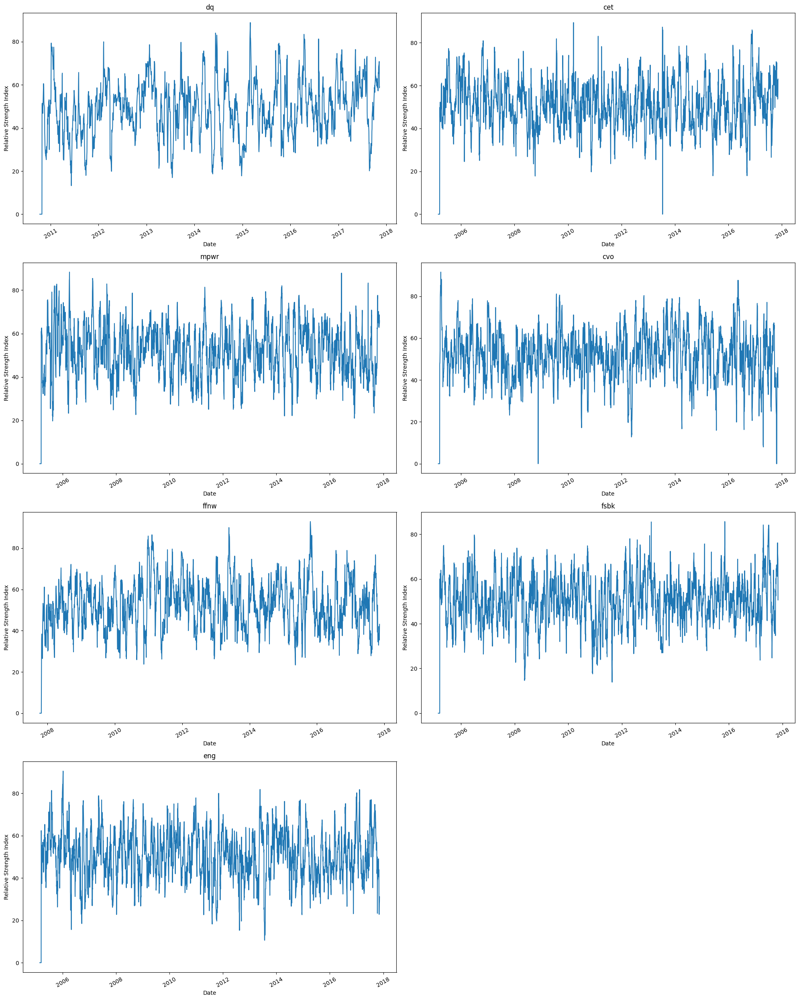

In [62]:
%matplotlib inline
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-64-630961526.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title(str(TechIndicator[i]['Label'][0]))


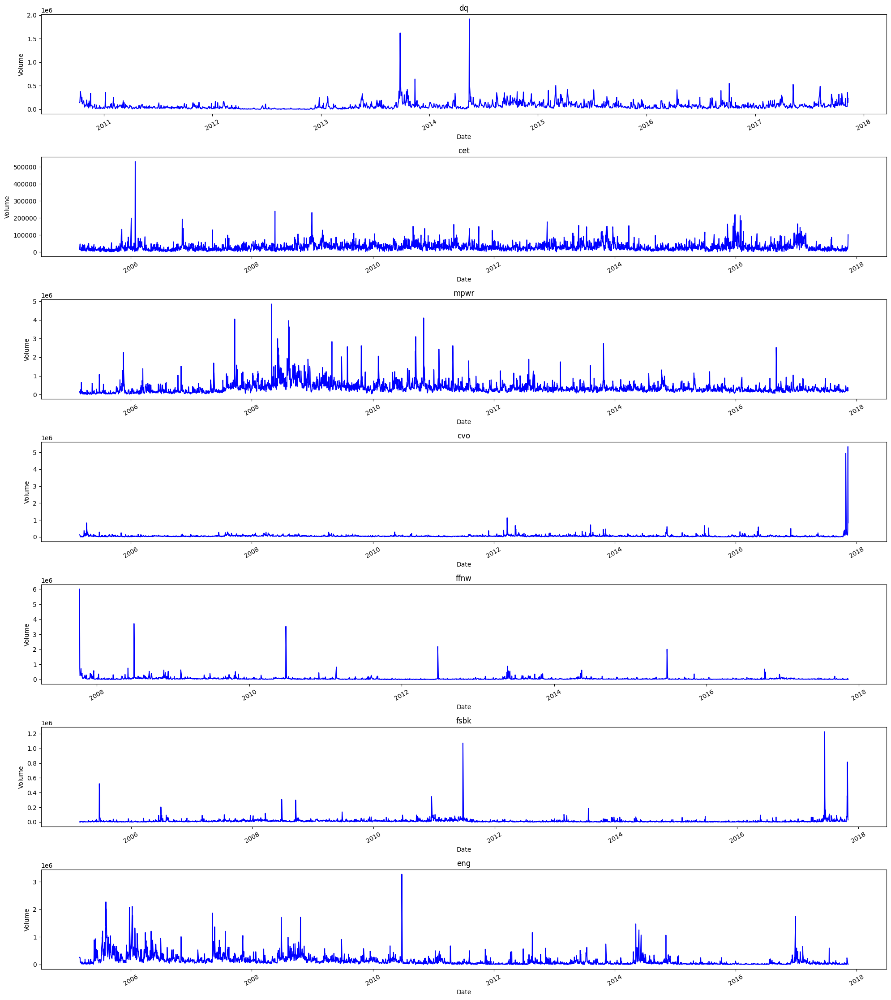

In [64]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-66-160041817.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))


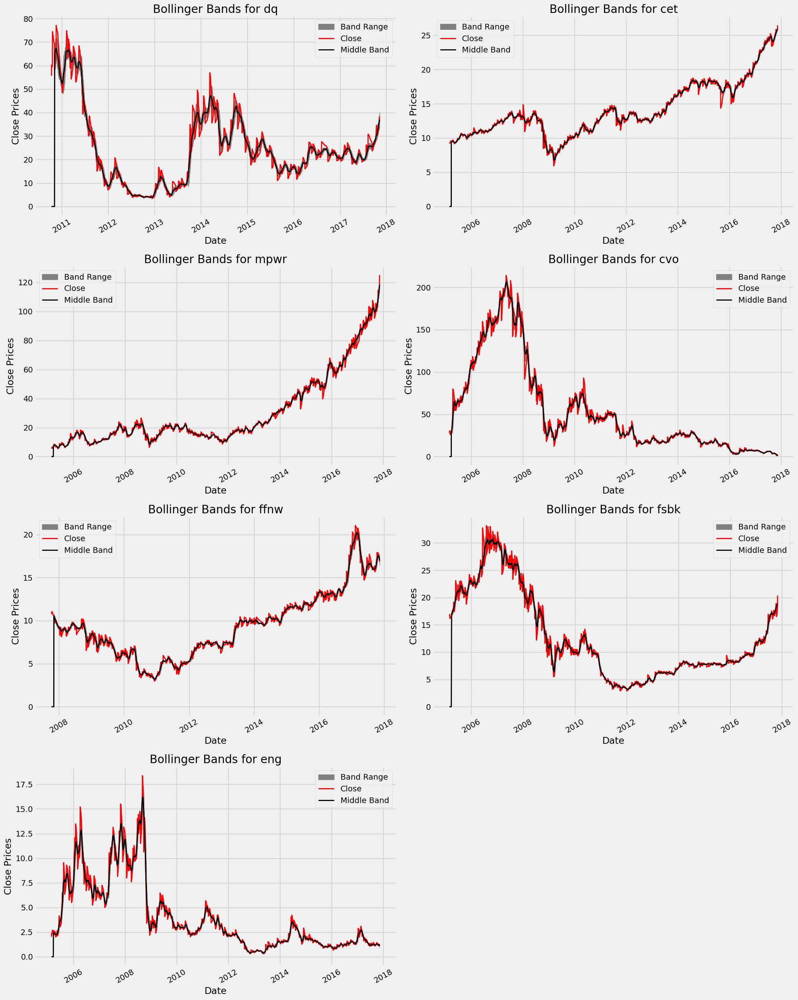

In [66]:
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-70-3655707094.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))


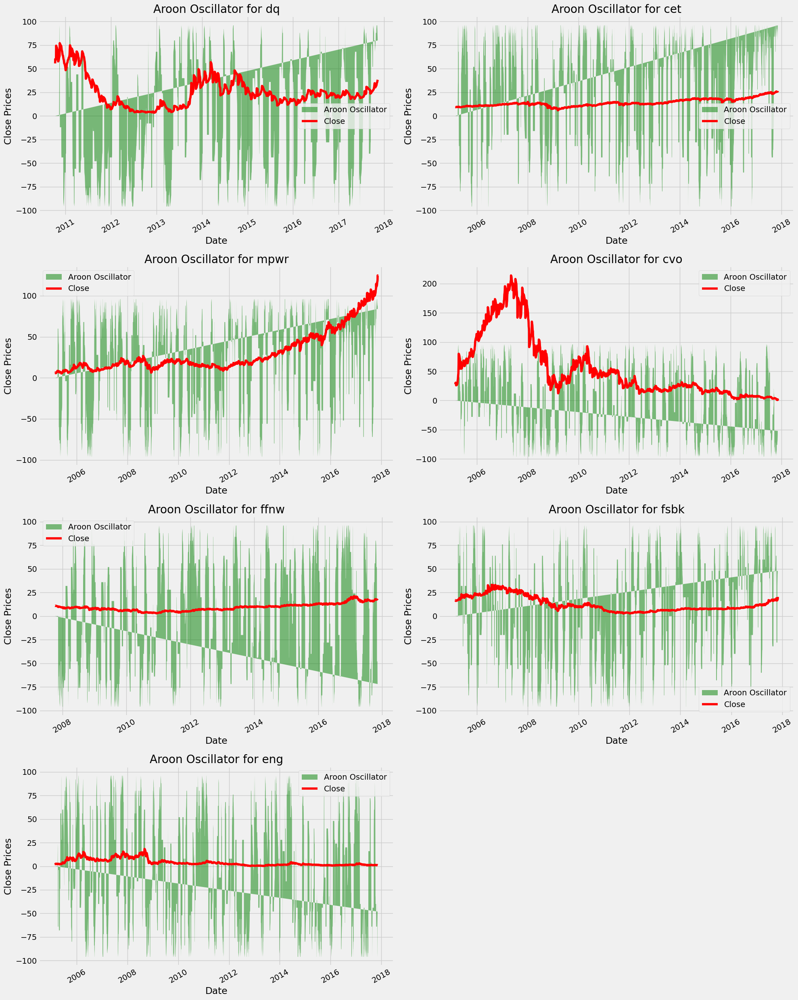

In [70]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-72-653539391.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))


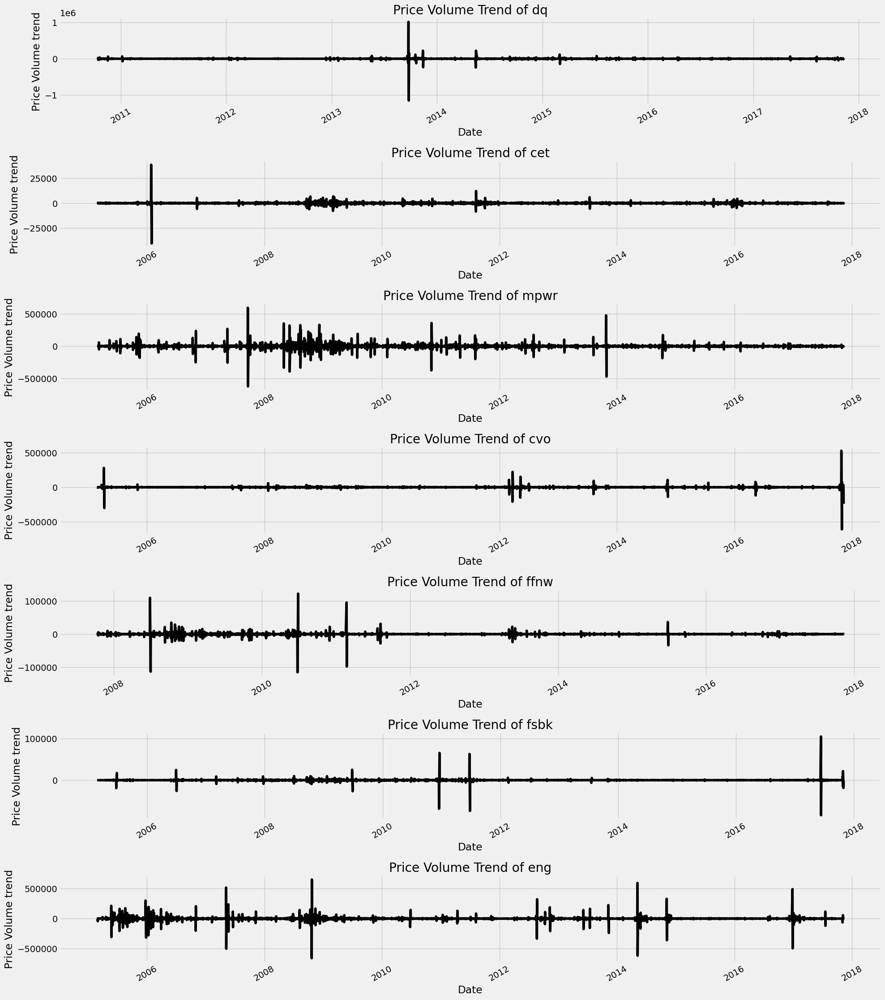

In [72]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-74-2651012033.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))


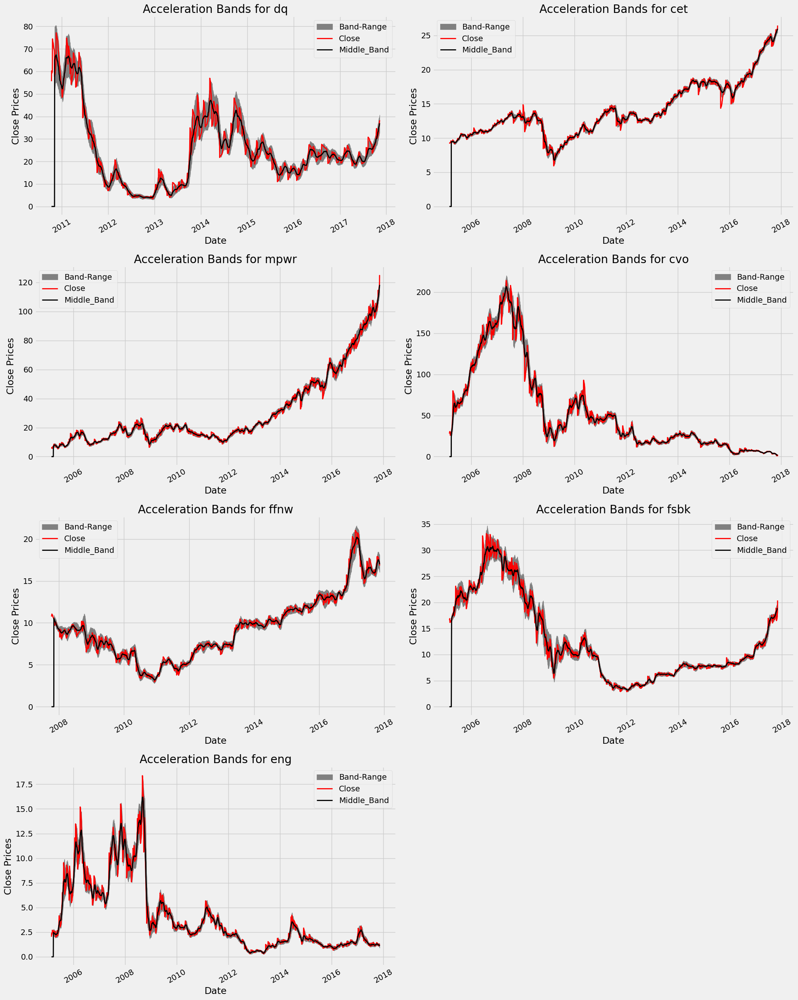

In [74]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-76-4070289447.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))


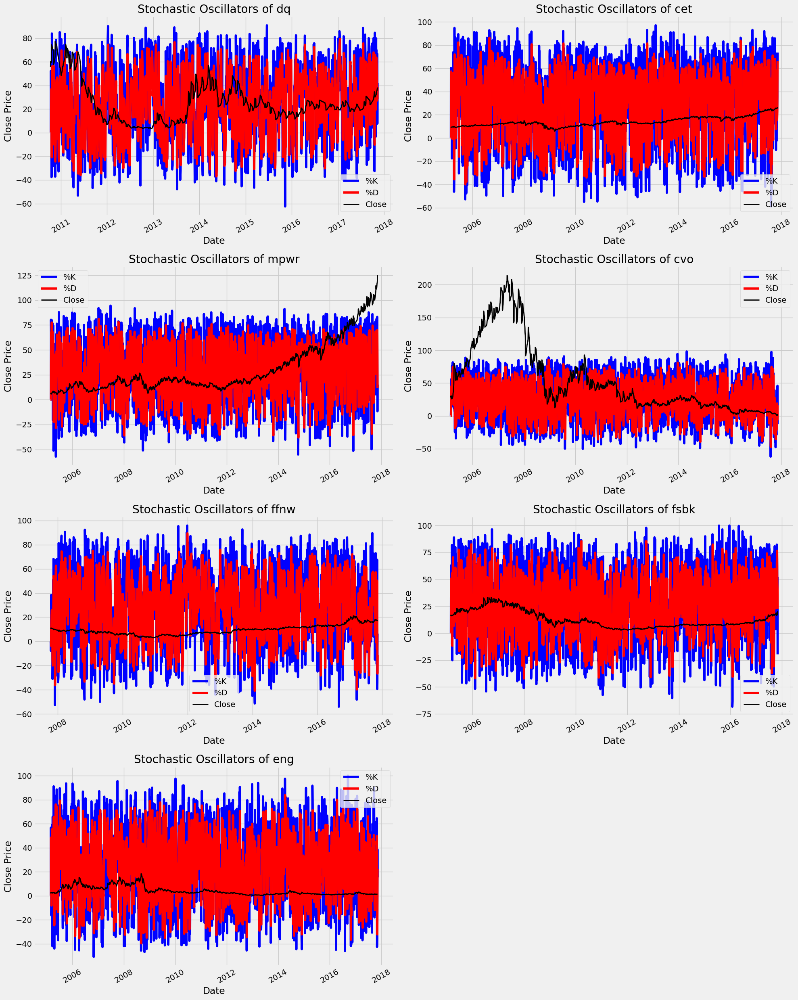

In [76]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-77-3072543166.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
/tmp/ipython-input-77-3072543166.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


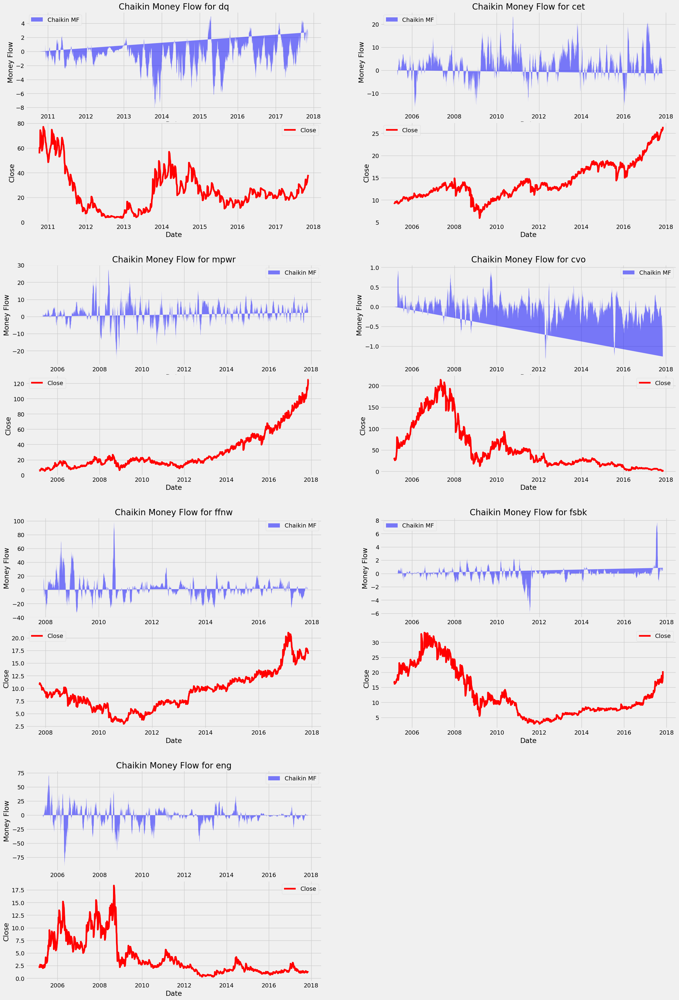

In [77]:
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)
for i in range(7):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)
    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        fig.add_subplot(ax)
fig.tight_layout()

/tmp/ipython-input-78-3780876235.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))


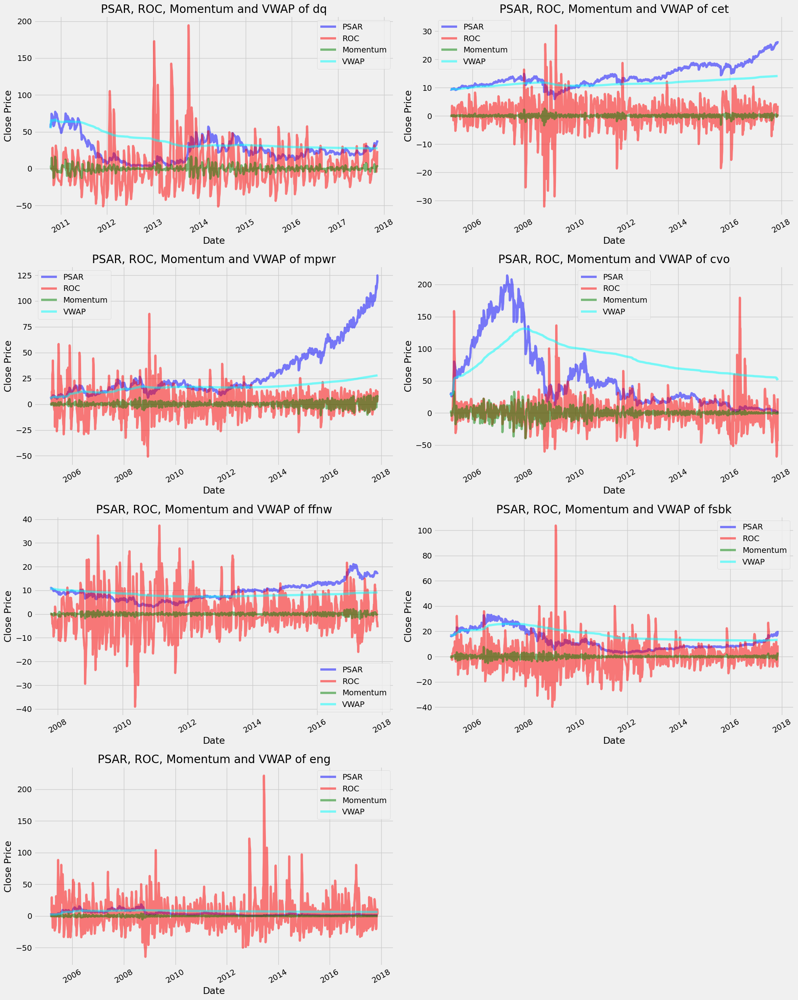

In [78]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-79-2871873877.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
/tmp/ipython-input-79-2871873877.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
/tmp/ipython-input-79-2871873877.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("OBV for " +str(TechIndicator[i]

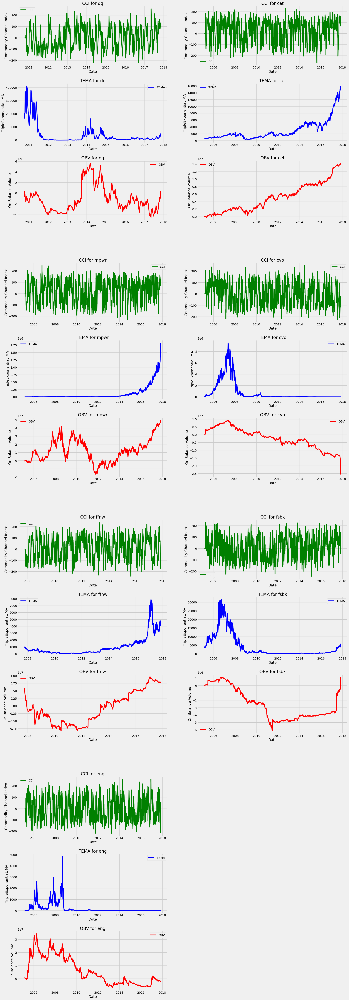

In [79]:
fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(7):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        ax.set_xlabel("Date")

        fig.add_subplot(ax)
fig.tight_layout()

/tmp/ipython-input-81-1496636783.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))


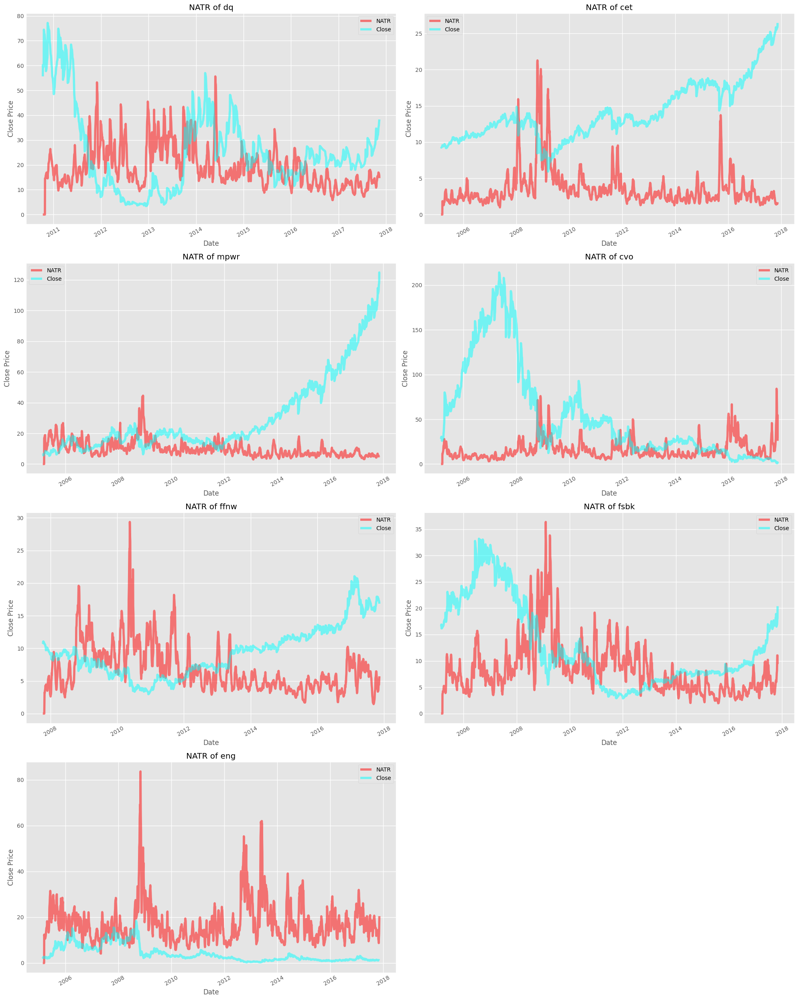

In [81]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-82-746875394.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))


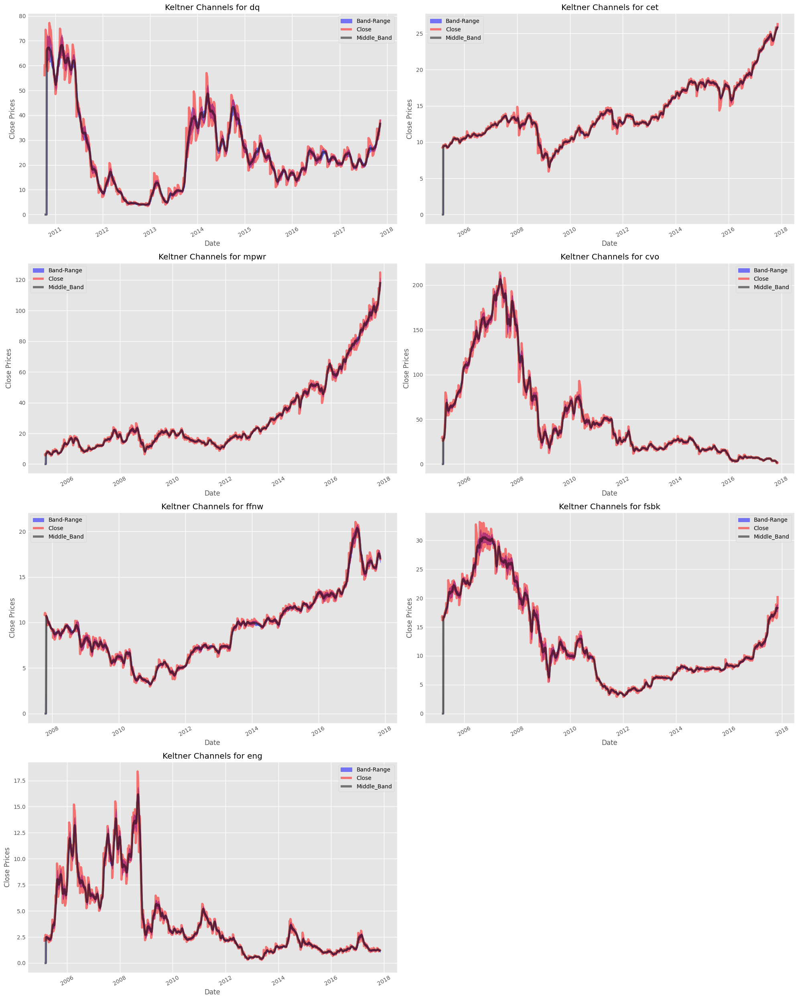

In [82]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'],
                    color='blue', label = "Band-Range", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-84-442073493.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))


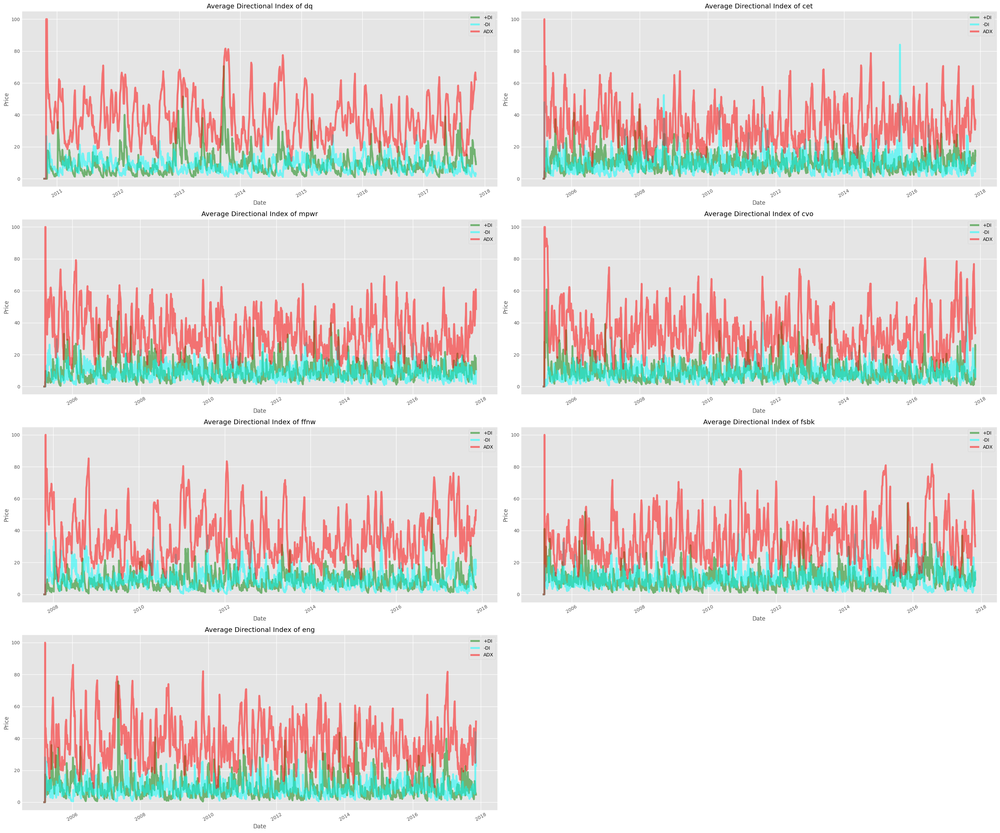

In [84]:
fig = plt.figure(figsize=(30,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/tmp/ipython-input-85-336455970.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
/tmp/ipython-input-85-336455970.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
/tmp/ipython-input-85-336455970.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t = ax.set_title("MINMAX Volume f

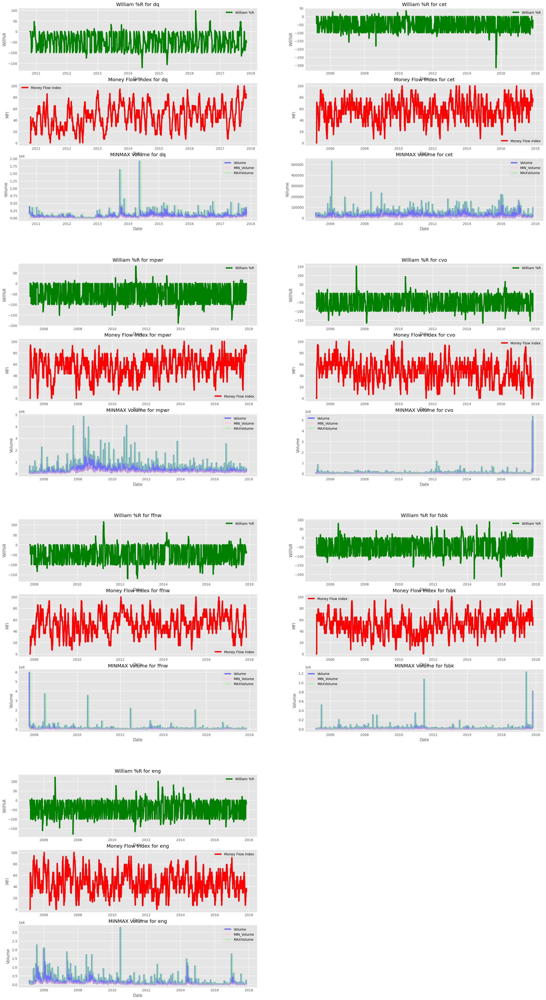

In [85]:
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(7):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")

            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        ax.set_xlabel("Date")
        fig.add_subplot(ax)
fig.tight_layout()

/tmp/ipython-input-87-2492799206.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))


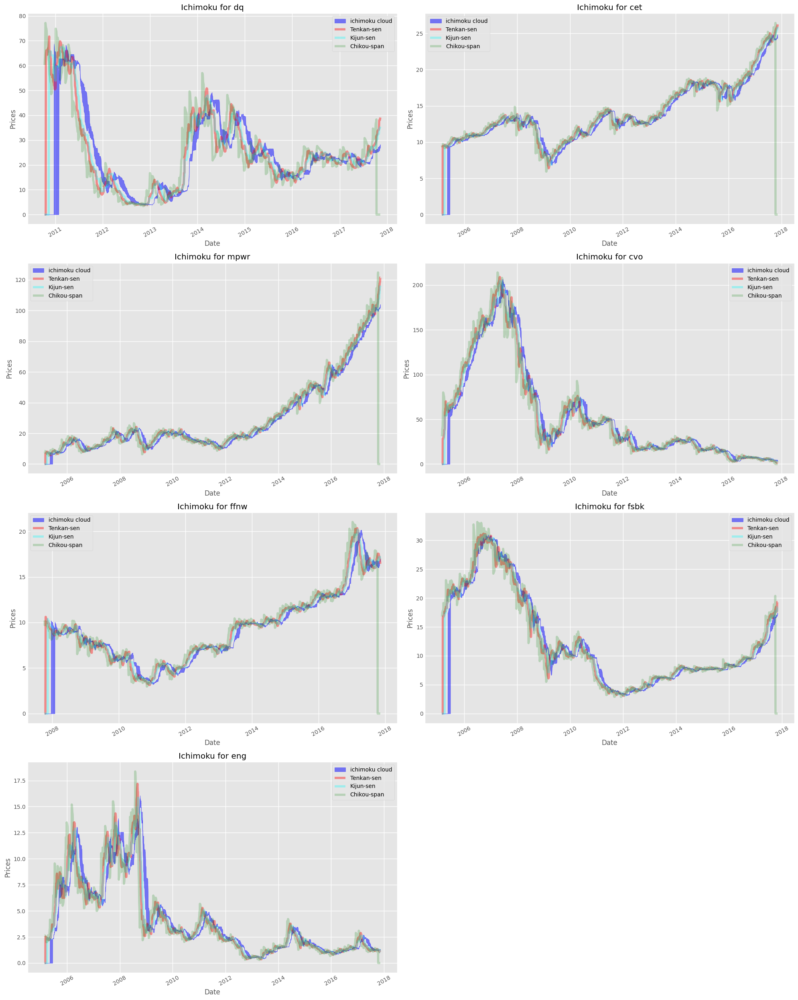

In [87]:
fig = plt.figure(figsize=(20,25))
for i in range(7):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'],
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()